# Data Science Pipeline Tutorial: College Data

### In this tutorial, we want to run through the data science pipeline from collecting data, cleaning and parsing it, performing exploratory data analysis, hypothesis testing, and machine learning.

This tutorial is designed in python, using a custom dataset adapted from the U.S. Department of Education's College Scorecard. To download the full dataset and documentation, visit https://collegescorecard.ed.gov/data/. We will be focusing on data from the Most Recent Data by Field of Study table in order to learn information about different universities' revenue, tuition costs, racial diversity, and more through the use of the data science pipeline.

## Setup
First, we import the libraries we want to use. We will be using a pandas dataframe to represent and manipulate the data, so we import the pandas library. Matplotlib and seaborn are both useful for plotting data visually, and folium is great for mapping.

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import folium
import seaborn as sns

## Loading and Viewing Data

Next, we extract the data from online by using pandas's read_csv() function and the url we use to access the data. If your data is stored locally, read_csv() also works on the path to the file where your data is stored.

In [2]:
url = 'https://raw.githubusercontent.com/aakayan/320_College_Data_Tutorial/main/data.txt'
df = pd.read_csv(url) # Read the data
df.head() # View the data

,Unnamed: 0,unit_id,inst_name,city,state,zip,accred_inst,inst_url,net_price_calc,sch_deg,...,atnd_cost_acad_yr,attnd_cost_prgm_yr,in_st_tuition,out_st_tuition,tuition_fee_prgm_yr,net_tuition_rev_per_fts,inst_expend_per_fts,avg_fac_salary,full_time_faculty_pct,fed_sch_code
0,0,100654,Alabama A & M University,Normal,AL,35762,Southern Association of Colleges and Schools C...,www.aamu.edu/,www.aamu.edu/admissions-aid/tuition-fees/net-p...,3.0,...,22489.0,NaN,9744.0,18354.0,NaN,7413.0,5384.0,7101.0,0.7411,001002
1,1,100663,University of Alabama at Birmingham,Birmingham,AL,35294-0110,Southern Association of Colleges and Schools C...,https://www.uab.edu,https://uab.studentaidcalculator.com/survey.aspx,3.0,...,24347.0,NaN,8568.0,19704.0,NaN,13177.0,16454.0,10717.0,0.7766,001052
2,2,100690,Amridge University,Montgomery,AL,36117-3553,Southern Association of Colleges and Schools C...,www.amridgeuniversity.edu,www2.amridgeuniversity.edu:9091/,3.0,...,17680.0,NaN,6900.0,6900.0,NaN,14273.0,4206.0,4292.0,1.0000,016885
3,3,100706,University of Alabama in Huntsville,Huntsville,AL,35899,Southern Association of Colleges and Schools C...,www.uah.edu,finaid.uah.edu/,3.0,...,23441.0,NaN,10714.0,22362.0,NaN,8677.0,9242.0,9442.0,0.6544,001055
4,4,100724,Alabama State University,Montgomery,AL,36104-0271,Southern Association of Colleges and Schools C...,www.alasu.edu,www.alasu.edu/cost-aid/tuition-costs/net-price...,3.0,...,21476.0,NaN,11068.0,19396.0,NaN,10160.0,8527.0,7754.0,0.5826,001005


This data is now loaded into our dataframe, df. A pandas dataframe is a 2-dimenstional structure that stores data, like a spreadsheet. With dataframes, pandas gives us many ways to interact with our data. This dataframe has each row representing a university, and each column representing one attribute of the university, such as its name, latitude and logitude, website url, and more.

However, it turns out we can't view all of the data. Let's change up some settings in pandas to view all the columns.

In [14]:
pd.options.display.max_columns = None #removes the limit on the maximum columns you can view
df.head() #View the data again

,Unnamed: 0,unit_id,inst_name,city,state,zip,accred_inst,inst_url,net_price_calc,sch_deg,height_cash_monitoring,state_fips,region,locale,latitude,longitude,hbcu,pbi,ANNHI,tribal,AANAPII,hisp_serving_inst,NANTI,men_only,women_only,adm_rate,adm_rate_all,UGDS,white_ugds,black_ugds,hisp_ugds,asian_ugds,AIAN_ugds,NHPI_ugds,birac_ugds,non_res_alien_ugds,unkn_ugds,title4_stud_pub,title4_stud_priv,atnd_cost_acad_yr,attnd_cost_prgm_yr,in_st_tuition,out_st_tuition,tuition_fee_prgm_yr,net_tuition_rev_per_fts,inst_expend_per_fts,avg_fac_salary,full_time_faculty_pct,fed_sch_code
0,0,100654,Alabama A & M University,Normal,AL,35762,Southern Association of Colleges and Schools C...,www.aamu.edu/,www.aamu.edu/admissions-aid/tuition-fees/net-p...,3.0,0,1,5,12.0,34.783368,-86.568502,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.8986,0.8986,4990.0,0.0186,0.9120,0.0088,0.0018,0.0022,0.0016,0.0118,0.0070,0.0361,592.0,NaN,22489.0,NaN,9744.0,18354.0,NaN,7413.0,5384.0,7101.0,0.7411,001002
1,1,100663,University of Alabama at Birmingham,Birmingham,AL,35294-0110,Southern Association of Colleges and Schools C...,https://www.uab.edu,https://uab.studentaidcalculator.com/survey.aspx,3.0,0,1,5,12.0,33.505697,-86.799345,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.9211,0.9211,13186.0,0.5717,0.2553,0.0334,0.0633,0.0034,0.0002,0.0457,0.0213,0.0058,1229.0,NaN,24347.0,NaN,8568.0,19704.0,NaN,13177.0,16454.0,10717.0,0.7766,001052
2,2,100690,Amridge University,Montgomery,AL,36117-3553,Southern Association of Colleges and Schools C...,www.amridgeuniversity.edu,www2.amridgeuniversity.edu:9091/,3.0,0,1,5,12.0,32.362609,-86.174010,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,351.0,0.2393,0.7151,0.0171,0.0057,0.0057,0.0000,0.0000,0.0000,0.0171,NaN,5.0,17680.0,NaN,6900.0,6900.0,NaN,14273.0,4206.0,4292.0,1.0000,016885
3,3,100706,University of Alabama in Huntsville,Huntsville,AL,35899,Southern Association of Colleges and Schools C...,www.uah.edu,finaid.uah.edu/,3.0,0,1,5,12.0,34.724557,-86.640449,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.8087,0.8087,7458.0,0.7167,0.0969,0.0528,0.0381,0.0095,0.0008,0.0296,0.0223,0.0333,585.0,NaN,23441.0,NaN,10714.0,22362.0,NaN,8677.0,9242.0,9442.0,0.6544,001055
4,4,100724,Alabama State University,Montgomery,AL,36104-0271,Southern Association of Colleges and Schools C...,www.alasu.edu,www.alasu.edu/cost-aid/tuition-costs/net-price...,3.0,0,1,5,12.0,32.364317,-86.295677,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.9774,0.9774,3903.0,0.0167,0.9352,0.0095,0.0041,0.0013,0.0005,0.0102,0.0102,0.0123,523.0,NaN,21476.0,NaN,11068.0,19396.0,NaN,10160.0,8527.0,7754.0,0.5826,001005


## Missing Data
In this data, you can see that some values in some columns are listed as "NaN". This means that there is missing data for this column from the selected university. There are many ways to deal with missing data, such as trying to fill in reasonable values or simply removing the associated row or column. In order to best determine what to do about missing data, let us first evaluate which columns have the most missing data.

In [4]:
missing_count_df = pd.DataFrame(df.isna().sum(),columns=["Missing Values"]) #creating a new dataframe by summing how many values in each column are missing
missing_count_df[(missing_count_df.T != 0).any()] #switching around rows and columns for easier viewing
missing_count_df.sort_values(by=["Missing Values"], ascending=False).head(10) #viewing the top 10 columns with the most missing data

,Missing Values
blackNH_ugds,6806
whiteNH_ugds,6806
act_wr_mid,6481
act_wr_75pct,6481
act_wr_25pct,6481
sat_wr_75pct,6074
sat_wr_25pct,6074
sat_wr_mid,6074
act_en_75pct,5607
act_en_25pct,5607


The columns missing the most data are the columns for number of Black, non-hispanic undergraduates, the number of White non-hispanic undergraduates, as well as statistics about mean SAT and ACT section scores. 

This could be for various reasons. For example, the dataframe already has columns for Black students, White students, and Hispanic students, so likely they did not also count the overlapping Black and Hispanic or White and Hispanic students. Instead, they kept them separated. As a result, they also did not categorize the Black Non-Hispanic and White Non-Hispanic students. In this case, we do not know how to estimate how many of the Black and White students are not Hispanic, so we will opt to simply drop these columns.

The SAT and ACT sections may be missing data due to factors like test-optionality when students are applying, a lack of separating out the various scores once they are collected, or other reasons. We will opt to remove these columns too.

In [5]:
df = df.drop(columns=['blackNH_ugds','whiteNH_ugds', 'act_wr_75pct', 'act_wr_mid', 'act_wr_25pct', 'sat_wr_25pct', 'sat_wr_mid', 'sat_wr_75pct', 'act_en_25pct', 'act_en_75pct', 'act_mt_mid', 'act_en_mid', 'act_mt_75pct', 'act_mt_25pct', 'sat_vr_75pct', 'sat_vr_25pct', 'sat_vr_mid', 'sat_mt_mid', 'sat_mt_25pct', 'sat_mt_75pct', 'act_cm_75pct', 'act_cm_25pct', 'act_cm_mid', 'sat_avg', 'sat_avg_all'])
display(df)

,Unnamed: 0,unit_id,inst_name,city,state,zip,accred_inst,inst_url,net_price_calc,sch_deg,height_cash_monitoring,state_fips,region,locale,latitude,longitude,hbcu,pbi,ANNHI,tribal,AANAPII,hisp_serving_inst,NANTI,men_only,women_only,adm_rate,adm_rate_all,UGDS,white_ugds,black_ugds,hisp_ugds,asian_ugds,AIAN_ugds,NHPI_ugds,birac_ugds,non_res_alien_ugds,unkn_ugds,title4_stud_pub,title4_stud_priv,atnd_cost_acad_yr,attnd_cost_prgm_yr,in_st_tuition,out_st_tuition,tuition_fee_prgm_yr,net_tuition_rev_per_fts,inst_expend_per_fts,avg_fac_salary,full_time_faculty_pct,fed_sch_code
0,0,100654,Alabama A & M University,Normal,AL,35762,Southern Association of Colleges and Schools C...,www.aamu.edu/,www.aamu.edu/admissions-aid/tuition-fees/net-p...,3.0,0,1,5,12.0,34.783368,-86.568502,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.8986,0.8986,4990.0,0.0186,0.9120,0.0088,0.0018,0.0022,0.0016,0.0118,0.0070,0.0361,592.0,NaN,22489.0,NaN,9744.0,18354.0,NaN,7413.0,5384.0,7101.0,0.7411,001002
1,1,100663,University of Alabama at Birmingham,Birmingham,AL,35294-0110,Southern Association of Colleges and Schools C...,https://www.uab.edu,https://uab.studentaidcalculator.com/survey.aspx,3.0,0,1,5,12.0,33.505697,-86.799345,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.9211,0.9211,13186.0,0.5717,0.2553,0.0334,0.0633,0.0034,0.0002,0.0457,0.0213,0.0058,1229.0,NaN,24347.0,NaN,8568.0,19704.0,NaN,13177.0,16454.0,10717.0,0.7766,001052
2,2,100690,Amridge University,Montgomery,AL,36117-3553,Southern Association of Colleges and Schools C...,www.amridgeuniversity.edu,www2.amridgeuniversity.edu:9091/,3.0,0,1,5,12.0,32.362609,-86.174010,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,351.0,0.2393,0.7151,0.0171,0.0057,0.0057,0.0000,0.0000,0.0000,0.0171,NaN,5.0,17680.0,NaN,6900.0,6900.0,NaN,14273.0,4206.0,4292.0,1.0000,016885
3,3,100706,University of Alabama in Huntsville,Huntsville,AL,35899,Southern Association of Colleges and Schools C...,www.uah.edu,finaid.uah.edu/,3.0,0,1,5,12.0,34.724557,-86.640449,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.8087,0.8087,7458.0,0.7167,0.0969,0.0528,0.0381,0.0095,0.0008,0.0296,0.0223,0.0333,585.0,NaN,23441.0,NaN,10714.0,22362.0,NaN,8677.0,9242.0,9442.0,0.6544,001055
4,4,100724,Alabama State University,Montgomery,AL,36104-0271,Southern Association of Colleges and Schools C...,www.alasu.edu,www.alasu.edu/cost-aid/tuition-costs/net-price...,3.0,0,1,5,12.0,32.364317,-86.295677,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.9774,0.9774,3903.0,0.0167,0.9352,0.0095,0.0041,0.0013,0.0005,0.0102,0.0102,0.0123,523.0,NaN,21476.0,NaN,11068.0,19396.0,NaN,10160.0,8527.0,7754.0,0.5826,001005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6801,6801,48511112,Georgia Military College - Dublin,Dublin,GA,310215149,Southern Association of Colleges and Schools C...,https://www.gmc.edu/index.cms,NaN,NaN,0,13,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6120.0,NaN,NaN,NaN,NaN,NaN,NaN,001571
6802,6802,48511113,Georgia Military College - Eastman,Eastman,GA,310236109,Southern Association of Colleges and Schools C...,https://www.gmc.edu/index.cms,NaN,NaN,0,13,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6120.0,NaN,NaN,NaN,NaN,NaN,NaN,001571
6803,6803,48616901,American College of Barbering - Florence,Florence,KY,410421801,National Accrediting Commission of Career Arts...,NaN,NaN,NaN,0,21,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13700.0,NaN,NaN,NaN,NaN,042048
6804,6804,49005401,HCI College - Fort Lauderdale Campus,Fort Lauderdale,FL,33309,Accrediting Commission of Career Schools and C...,www.hci.edu/,NaN,2.0,0,12,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.8182,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21420.0,NaN,N

## Exploratory Data Analysis

There are 6800 rows in our dataframe currently, which means there are a lot of Universities to look at. Here we can see them all mapped using the folium library, with a dot marker for each university.

In [6]:
m = folium.Map(location=[30, -95], zoom_start=3.5) #create a map in Folium


for r in df.iterrows(): #perform the following for each row in the dataframe--
    if((pd.isna(r[1].latitude) == False) and (pd.isna(r[1].longitude) == False)): #if lat and long are not NaN
        m.add_child(folium.CircleMarker(location=[r[1].latitude, r[1].longitude], fill='true', radius = 5,
        popup= 'Hi',fill_color='blue', color = 'clear',fill_opacity=1)) #create a dot marker and add to the map

In [7]:
m #display the map with the new markers

[Text(0, 0.5, 'Unnamed: 0'),
 Text(0, 1.5, 'unit_id'),
 Text(0, 2.5, 'sch_deg'),
 Text(0, 3.5, 'height_cash_monitoring'),
 Text(0, 4.5, 'state_fips'),
 Text(0, 5.5, 'region'),
 Text(0, 6.5, 'locale'),
 Text(0, 7.5, 'latitude'),
 Text(0, 8.5, 'longitude'),
 Text(0, 9.5, 'hbcu'),
 Text(0, 10.5, 'pbi'),
 Text(0, 11.5, 'ANNHI'),
 Text(0, 12.5, 'tribal'),
 Text(0, 13.5, 'AANAPII'),
 Text(0, 14.5, 'hisp_serving_inst'),
 Text(0, 15.5, 'NANTI'),
 Text(0, 16.5, 'men_only'),
 Text(0, 17.5, 'women_only'),
 Text(0, 18.5, 'adm_rate'),
 Text(0, 19.5, 'adm_rate_all'),
 Text(0, 20.5, 'UGDS'),
 Text(0, 21.5, 'white_ugds'),
 Text(0, 22.5, 'black_ugds'),
 Text(0, 23.5, 'hisp_ugds'),
 Text(0, 24.5, 'asian_ugds'),
 Text(0, 25.5, 'AIAN_ugds'),
 Text(0, 26.5, 'NHPI_ugds'),
 Text(0, 27.5, 'birac_ugds'),
 Text(0, 28.5, 'non_res_alien_ugds'),
 Text(0, 29.5, 'unkn_ugds'),
 Text(0, 30.5, 'title4_stud_pub'),
 Text(0, 31.5, 'title4_stud_priv'),
 Text(0, 32.5, 'atnd_cost_acad_yr'),
 Text(0, 33.5, 'attnd_cost_prgm_yr

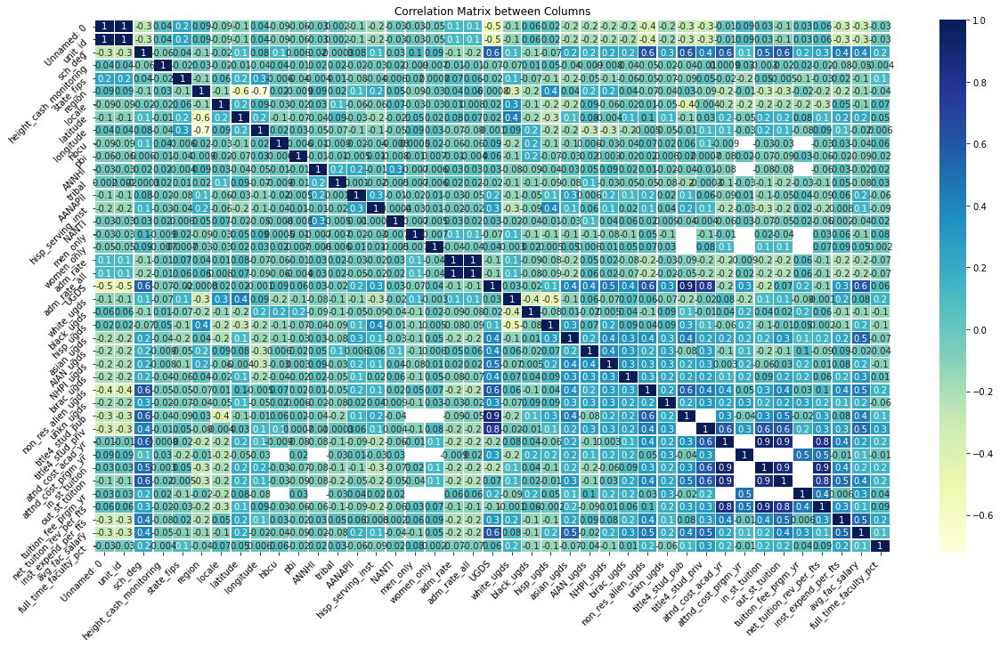